<a href="https://colab.research.google.com/github/ssuppe/bloogsugarml/blob/main/1)_Blood_Sugar_ML_Investigation_Linear_Regression_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import json
import pandas as pd

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data prep

In [26]:
# First, basic data ingestion and date parsing
with open('/content/drive/MyDrive/src/blood_sugar_ml/nightscout_entries_21-26 July2024.json', "r") as f:
  js = json.load(f)

data = []
# From JSON, create dataset
# display(js[0])
for j in js:
  # display(j['date']['$numberLong'])
  data.append([j['date']['$numberLong'], j['utcOffset'],j['sgv'],j['direction'] ])

data = pd.DataFrame(data)
data.columns = ["timestamp", "utcOffset", "sgv", "direction"]
data['date'] = pd.to_datetime(data['timestamp'],unit='ms')
# Get rid of seconds precision, and round to nearest 5 minutes
data['date'] = data['date'].dt.floor('min').dt.round("5min")
data.head()

<ipython-input-26-63d1207e09da>:14: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  data['date'] = pd.to_datetime(data['timestamp'],unit='ms')


,timestamp,utcOffset,sgv,direction,date
0,1721556338000,60,101,FortyFiveUp,2024-07-21 10:05:00
1,1721556637000,60,110,FortyFiveUp,2024-07-21 10:10:00
2,1721556938000,60,118,FortyFiveUp,2024-07-21 10:15:00
3,1721557237000,60,125,FortyFiveUp,2024-07-21 10:20:00
4,1721557537000,60,127,FortyFiveUp,2024-07-21 10:25:00


In [135]:
# Next: creation of features
# Previous absolute values
data["hour"] = data["date"].apply(lambda x: x.hour)

data["sgv-5"] = data["sgv"].shift(1)
data["sgv-15"] = data["sgv"].shift(3)
data["sgv-30"] = data["sgv"].shift(6)
data["sgv-60"] = data["sgv"].shift(12)
data["sgv-90"] = data["sgv"].shift(18)
data["sgv-120"] = data["sgv"].shift(24)
data["sgv-150"] = data["sgv"].shift(30)
data["sgv-180"] = data["sgv"].shift(36)
data["sgv-210"] = data["sgv"].shift(42)
data["sgv-240"] = data["sgv"].shift(48)

data["sgv-5delta"] = data["sgv"] - data["sgv"].shift(1)
data["sgv-15delta"] = data["sgv"] - data["sgv"].shift(3)
data["sgv-30delta"] = data["sgv"] - data["sgv"].shift(6)
data["sgv-60delta"] = data["sgv"] - data["sgv"].shift(12)
data["sgv-90delta"] = data["sgv"] - data["sgv"].shift(18)
data["sgv-120delta"] = data["sgv"] - data["sgv"].shift(24)
data["sgv-150delta"] = data["sgv"] - data["sgv"].shift(30)
data["sgv-180delta"] = data["sgv"] -  data["sgv"].shift(36)
data["sgv-210delta"] = data["sgv"] - data["sgv"].shift(42)
data["sgv-240delta"] = data["sgv"] - data["sgv"].shift(48)
data = data.dropna()
display(data.head(10))



,timestamp,utcOffset,sgv,direction,date,sgv-5,sgv-15,sgv-30,sgv-60,sgv-90,...,sgv-120delta,hour,sgv-150,sgv-180,sgv-210,sgv-240,sgv-150delta,sgv-180delta,sgv-210delta,sgv-240delta
48,1721570739000,60,90,Flat,2024-07-21 14:05:00,89.0,88.0,86.0,98.0,77.0,...,-47.0,14,175.0,183.0,137.0,101.0,-85.0,-93.0,-47.0,-11.0
49,1721571038000,60,90,Flat,2024-07-21 14:10:00,90.0,88.0,87.0,89.0,76.0,...,-40.0,14,171.0,179.0,154.0,110.0,-81.0,-89.0,-64.0,-20.0
50,1721571338000,60,90,Flat,2024-07-21 14:15:00,90.0,89.0,88.0,81.0,80.0,...,-30.0,14,164.0,173.0,171.0,118.0,-74.0,-83.0,-81.0,-28.0
51,1721571638000,60,89,Flat,2024-07-21 14:20:00,90.0,90.0,88.0,79.0,91.0,...,-18.0,14,156.0,171.0,180.0,125.0,-67.0,-82.0,-91.0,-36.0
52,1721571938000,60,87,Flat,2024-07-21 14:25:00,89.0,90.0,88.0,82.0,101.0,...,-7.0,14,150.0,171.0,184.0,127.0,-63.0,-84.0,-97.0,-40.0
53,1721572238000,60,86,Flat,2024-07-21 14:30:00,87.0,90.0,89.0,84.0,104.0,...,3.0,14,144.0,174.0,185.0,130.0,-58.0,-88.0,-99.0,-44.0
54,1721572538000,60,85,Flat,2024-07-21 14:35:00,86.0,89.0,90.0,86.0,98.0,...,8.0,14,137.0,175.0,183.0,137.0,-52.0,-90.0,-98.0,-52.0
55,1721572839000,60,86,Flat,2024-07-21 14:40:00,85.0,87.0,90.0,87.0,89.0,...,10.0,14,130.0,171.0,179.0,154.0,-44.0,-85.0,-93.0,-68.0
56,1721573138000,60,87,Flat,2024-07-21 14:45:00,86.0,86.0,90.0,88.0,81.0,...,7.0,14,120.0,164.0,173.0,171.0,-33.0,-77.0,-86.0,-84.0
57,1721573438000,60,89,Flat,2024-07-21 14:50:00,87.0,85.0,89.0,88.0,79.0,...,-2.0,14,107.0,156.0,171.0,180.0,-18.0,-67.0,-82.0,-91.0


# MLCC Linear regression exercise
Taken from [here](https://colab.corp.google.com/google_src/files/head/depot/google3/engedu/ml/mlcc/next-gen-colabs/linear-regression-exercise.ipynb?mlpp=0)

In [136]:
import io

# data
import numpy as np
import pandas as pd

# machine learning
import keras

# data visualization
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns

In [137]:
# Describe the data and get to know it
data.describe(include='all')

,timestamp,utcOffset,sgv,direction,date,sgv-5,sgv-15,sgv-30,sgv-60,sgv-90,...,sgv-120delta,hour,sgv-150,sgv-180,sgv-210,sgv-240,sgv-150delta,sgv-180delta,sgv-210delta,sgv-240delta
count,1368,1368.0,1368.000000,1368,1368,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000,...,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000
unique,1368,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,1721570739000,NaN,NaN,Flat,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,1156,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,60.0,111.763158,NaN,2024-07-24 00:05:34.210526464,111.762427,111.754386,111.709795,111.615497,111.649854,...,0.013158,11.336257,111.976608,112.206871,112.399854,112.453216,-0.213450,-0.443713,-0.636696,-0.690058
min,NaN,60.0,40.000000,NaN,2024-07-21 14:05:00,40.000000,40.000000,40.000000,40.000000,40.000000,...,-138.000000,0.000000,40.000000,40.000000,40.000000,40.000000,-121.000000,-117.000000,-114.000000,-108.000000
25%,NaN,60.0,93.750000,NaN,2024-07-22 18:33:45,93.750000,93.000000,93.000000,93.000000,93.000000,...,-23.000000,5.000000,93.000000,93.000000,93.000000,93.000000,-25.000000,-25.000000,-25.250000,-29.000000
50%,NaN,60.0,110.000000,NaN,2024-07-24 01:02:30,110.000000,110.000000,110.000000,110.000000,110.000000,...,-1.000000,11.000000,110.000000,110.000000,110.000000,110.000000,-1.000000,-1.000000,0.000000,1.000000
75%,NaN,60.0,129.000000,NaN,2024-07-25 05:31:15,129.000000,129.000000,129.000000,129.000000,129.000000,...,21.000000,17.000000,129.000000,130.000000,130.000000,130.000000,21.000000,22.000000,25.000000,24.000000
max,NaN,60.0,216.000000,NaN,2024-07-26 10:00:00,216.000000,216.000000,216.000000,216.000000,216.000000,...,126.000000,23.000000,216.000000,216.000000,216.000000,216.000000,113.000000,100.000000,115.000000,96.000000


Here are some observations
* This was a good 7 days for me (I knew this already, my Clarity app tells me I was 94% in range, 3% high, 2% low)
* The stats say my mean/median is 112/110, which is awesome
* Min was 40 (pretty low!) and my max was 216 (pretty high!)
* My median 5 minute delta is 0, which means I'm generally very stable, not much roller coasting


In [138]:
# Correlation matrix
# First, create a df matrix of the features I want to use
numeric_values = ["sgv", "direction", "date", "sgv-5", "sgv-15", "sgv-30", "sgv-60", "sgv-90", "sgv-120","sgv-150","sgv-180","sgv-210","sgv-240", "sgv-5delta", "sgv-15delta", "sgv-30delta", "sgv-60delta", "sgv-90delta", "sgv-120delta", "sgv-150delta","sgv-180delta","sgv-210delta","sgv-240delta","hour"]
df = data[numeric_values]
df.corr(numeric_only = True)

,sgv,sgv-5,sgv-15,sgv-30,sgv-60,sgv-90,sgv-120,sgv-150,sgv-180,sgv-210,...,sgv-15delta,sgv-30delta,sgv-60delta,sgv-90delta,sgv-120delta,sgv-150delta,sgv-180delta,sgv-210delta,sgv-240delta,hour
sgv,1.000000,0.983858,0.883810,0.672517,0.284095,0.088959,-0.001477,0.022519,0.051646,0.017214,...,0.240522,0.403446,0.596615,0.674053,0.707046,0.695813,0.680618,0.689779,0.712208,-0.057336
sgv-5,0.983858,1.000000,0.942154,0.746800,0.334035,0.115109,0.002530,0.013431,0.051124,0.026254,...,0.085996,0.291673,0.541346,0.642715,0.692816,0.690849,0.669404,0.671898,0.694871,-0.056914
sgv-15,0.883810,0.942154,1.000000,0.884305,0.454966,0.171908,0.023901,-0.001432,0.041683,0.037142,...,-0.241535,-0.001884,0.356644,0.526553,0.607069,0.630293,0.604444,0.593755,0.613040,-0.057761
sgv-30,0.672517,0.746800,0.884305,1.000000,0.674444,0.285341,0.086907,-0.009453,0.013587,0.043638,...,-0.439760,-0.405853,-0.003367,0.286066,0.413340,0.485617,0.473241,0.440672,0.446784,-0.057849
sgv-60,0.284095,0.334035,0.454966,0.674444,1.000000,0.676443,0.284924,0.078955,-0.018927,0.004379,...,-0.354660,-0.483019,-0.599965,-0.291427,-0.000918,0.145551,0.218009,0.196333,0.164213,-0.050772
sgv-90,0.088959,0.115109,0.171908,0.285341,0.676443,1.000000,0.671659,0.274681,0.070783,-0.023429,...,-0.172142,-0.242926,-0.491965,-0.675791,-0.412171,-0.133994,0.011990,0.079437,0.058562,-0.046342
sgv-120,-0.001477,0.002530,0.023901,0.086907,0.284924,0.671659,1.000000,0.667770,0.273490,0.069917,...,-0.052651,-0.109272,-0.239719,-0.499211,-0.708212,-0.480781,-0.201698,-0.051666,0.016752,-0.058689
sgv-150,0.022519,0.013431,-0.001432,-0.009453,0.078955,0.274681,0.667770,1.000000,0.674062,0.284204,...,0.049677,0.039496,-0.047297,-0.187046,-0.456328,-0.702372,-0.478324,-0.189986,-0.034335,-0.069627
sgv-180,0.051646,0.051124,0.041683,0.013587,-0.018927,0.070783,0.273490,0.674062,1.000000,0.679551,...,0.020643,0.046980,0.058936,-0.014275,-0.156942,-0.447479,-0.696509,-0.455813,-0.163827,-0.104745
sgv-210,0.017214,0.026254,0.037142,0.043638,0.004379,-0.023429,0.069917,0.284204,0.679551,1.000000,...,-0.041354,-0.032694,0.010699,0.030115,-0.037290,-0.191917,-0.486161,-0.712038,-0.463531,-0.142934


Here are some observation
* The label is "sgv" - I'm trying to figure out what correlates more to my blood sugar now
* I think this isn't enough, I think having hour of day might be interesting. So going to go back and add that as a numerical feature.
* Hour didn't correlate at all, which I found a bit interesting (I figured mealtimes might correlate), but I guess we'll see as we move on.
* It's interesting that the delta 3 hours ago correlates so highly to svg NOW. This is weird and suspicious

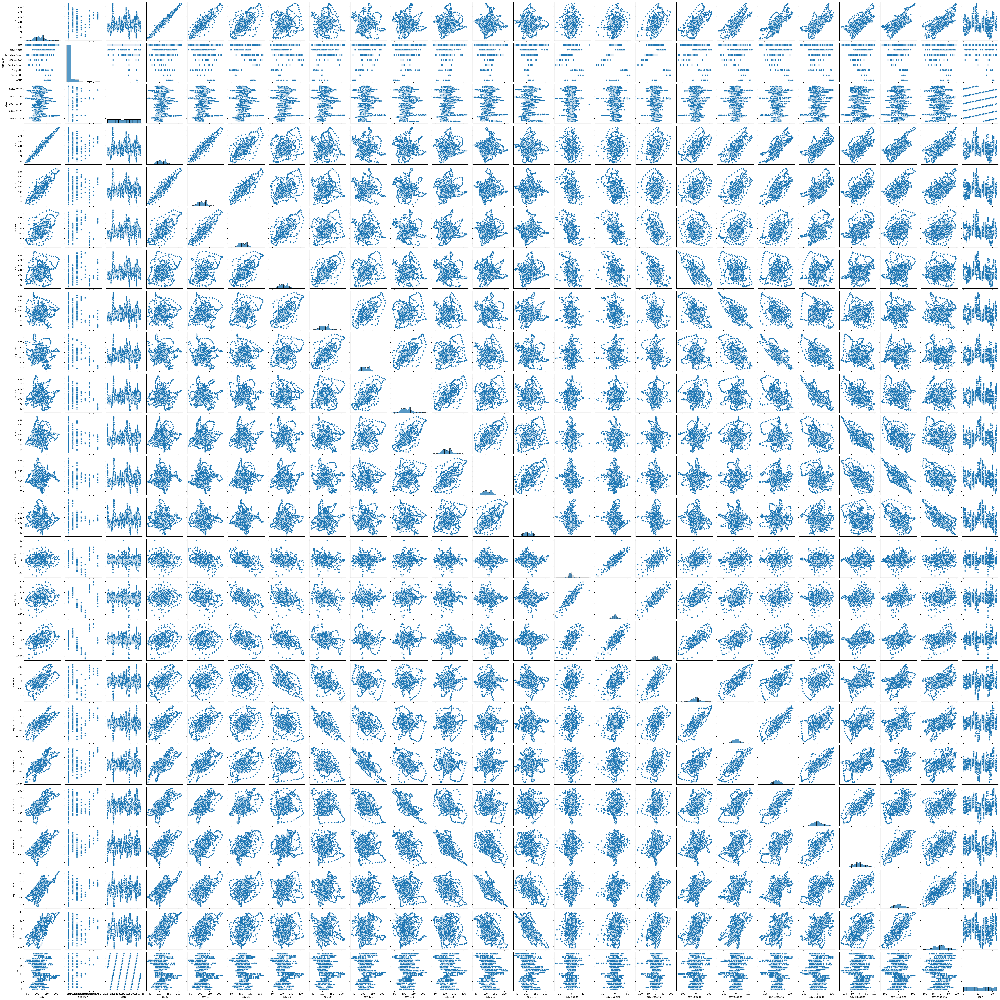

In [139]:
# Pairplot
sns.pairplot(df, x_vars=numeric_values, y_vars=numeric_values)

Observations of the pairplot:
* Almost totally linear correlation for SGV and the SGV 5 minutes ago (which is intuitive)
* Seems like there is some correlation at SGV-15 and at a stretch it looks like SVG-30 and SVG-60 (but still wide variance). Will be interesting to see what the L1 and L2 loss shows
* "Hour" seems to have interesting variation, which I think looks a lot like an hourly distribution plot

Hypothesis: A linear regression model with hour, SGV-5, 30, 60 would be interesting to try. But naively I don't think it'll be good enough to use in practice.

# Part 3 - Train Model


In [52]:
#@title Define plotting functions

def make_plots(df, feature_names, label_name, model_output, sample_size=200):

  random_sample = df.sample(n=sample_size).copy()
  random_sample.reset_index()
  weights, bias, epochs, rmse = model_output

  is_2d_plot = len(feature_names) == 1
  model_plot_type = "scatter" if is_2d_plot else "surface"
  fig = make_subplots(rows=1, cols=2,
                      subplot_titles=("Loss Curve", "Model Plot"),
                      specs=[[{"type": "scatter"}, {"type": model_plot_type}]])

  plot_data(random_sample, feature_names, label_name, fig)
  plot_model(random_sample, feature_names, weights, bias, fig)
  plot_loss_curve(epochs, rmse, fig)

  fig.show()
  return

def plot_loss_curve(epochs, rmse, fig):
  curve = px.line(x=epochs, y=rmse)
  curve.update_traces(line_color='#ff0000', line_width=3)

  fig.append_trace(curve.data[0], row=1, col=1)
  fig.update_xaxes(title_text="Epoch", row=1, col=1)
  fig.update_yaxes(title_text="Root Mean Squared Error", row=1, col=1, range=[rmse.min()*0.8, rmse.max()])

  return

def plot_data(df, features, label, fig):
  if len(features) == 1:
    scatter = px.scatter(df, x=features[0], y=label)
  else:
    scatter = px.scatter_3d(df, x=features[0], y=features[1], z=label)

  fig.append_trace(scatter.data[0], row=1, col=2)
  if len(features) == 1:
    fig.update_xaxes(title_text=features[0], row=1, col=2)
    fig.update_yaxes(title_text=label, row=1, col=2)
  else:
    fig.update_layout(scene1=dict(xaxis_title=features[0], yaxis_title=features[1], zaxis_title=label))

  return

def plot_model(df, features, weights, bias, fig):
  df['FARE_PREDICTED'] = bias[0]

  for index, feature in enumerate(features):
    df['FARE_PREDICTED'] = df['FARE_PREDICTED'] + weights[index][0] * df[feature]

  if len(features) == 1:
    model = px.line(df, x=features[0], y='FARE_PREDICTED')
    model.update_traces(line_color='#ff0000', line_width=3)
  else:
    z_name, y_name = "FARE_PREDICTED", features[1]
    z = [df[z_name].min(), (df[z_name].max() - df[z_name].min()) / 2, df[z_name].max()]
    y = [df[y_name].min(), (df[y_name].max() - df[y_name].min()) / 2, df[y_name].max()]
    x = []
    for i in range(len(y)):
      x.append((z[i] - weights[1][0] * y[i] - bias[0]) / weights[0][0])

    plane=pd.DataFrame({'x':x, 'y':y, 'z':[z] * 3})

    light_yellow = [[0, '#89CFF0'], [1, '#FFDB58']]
    model = go.Figure(data=go.Surface(x=plane['x'], y=plane['y'], z=plane['z'],
                                      colorscale=light_yellow))

  fig.add_trace(model.data[0], row=1, col=2)

  return

def model_info(feature_names, label_name, model_output):
  weights = model_output[0]
  bias = model_output[1]

  nl = "\n"
  header = "-" * 80
  banner = header + nl + "|" + "MODEL INFO".center(78) + "|" + nl + header

  info = ""
  equation = label_name + " = "

  for index, feature in enumerate(feature_names):
    info = info + "Weight for feature[{}]: {:.3f}\n".format(feature, weights[index][0])
    equation = equation + "{:.3f} * {} + ".format(weights[index][0], feature)

  info = info + "Bias: {:.3f}\n".format(bias[0])
  equation = equation + "{:.3f}\n".format(bias[0])

  return banner + nl + info + nl + equation

print("SUCCESS: defining plotting functions complete.")

SUCCESS: defining plotting functions complete.


In [140]:
#@title Code - Define ML functions

def build_model(my_learning_rate, num_features):
  """Create and compile a simple linear regression model."""
  # Most simple keras models are sequential.
  model = keras.models.Sequential()

  # Describe the topography of the model.
  # The topography of a simple linear regression model
  # is a single node in a single layer.
  model.add(keras.layers.Dense(units=1,
                                  input_shape=(num_features,)))

  # Compile the model topography into code that TensorFlow can efficiently
  # execute. Configure training to minimize the model's mean squared error.
  model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=my_learning_rate),
                loss="mean_squared_error",
                metrics=[keras.metrics.RootMeanSquaredError()])

  return model


def train_model(model, df, features, label, epochs, batch_size):
  """Train the model by feeding it data."""

  # Feed the model the feature and the label.
  # The model will train for the specified number of epochs.
  # input_x = df.iloc[:,1:3].values
  # df[feature]
  history = model.fit(x=features,
                      y=label,
                      batch_size=batch_size,
                      epochs=epochs)

  # Gather the trained model's weight and bias.
  trained_weight = model.get_weights()[0]
  trained_bias = model.get_weights()[1]

  # The list of epochs is stored separately from the rest of history.
  epochs = history.epoch

  # Isolate the error for each epoch.
  hist = pd.DataFrame(history.history)

  # To track the progression of training, we're going to take a snapshot
  # of the model's root mean squared error at each epoch.
  rmse = hist["root_mean_squared_error"]

  return trained_weight, trained_bias, epochs, rmse


def run_experiment(df, feature_names, label_name, learning_rate, epochs, batch_size):

  print('INFO: starting training experiment with features={} and label={}\n'.format(feature_names, label_name))

  num_features = len(feature_names)

  features = df.loc[:, feature_names].values
  label = df[label_name].values
  # display(features)
  # display(label)
  model = build_model(learning_rate, num_features)
  model_output = train_model(model, df, features, label, epochs, batch_size)

  print('\nSUCCESS: training experiment complete\n')
  print('{}'.format(model_info(feature_names, label_name, model_output)))
  make_plots(df, feature_names, label_name, model_output)

  return model

print("SUCCESS: defining linear regression functions complete.")

SUCCESS: defining linear regression functions complete.


In [141]:
#@title Code - Experiment 1 with SVG-5

# The following variables are the hyperparameters.
learning_rate = 0.001
epochs = 25
batch_size = 50

# Specify the feature and the label.
features = ['sgv-5']
label = 'sgv'

model_1 = run_experiment(df.dropna(), features, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-5'] and label=sgv

Epoch 1/25
28/28 [==============================] - 0s 2ms/step - loss: 50482.9258 - root_mean_squared_error: 224.6841
Epoch 2/25
28/28 [==============================] - 0s 1ms/step - loss: 48942.6562 - root_mean_squared_error: 221.2299
Epoch 3/25
28/28 [==============================] - 0s 2ms/step - loss: 47520.8789 - root_mean_squared_error: 217.9928
Epoch 4/25
28/28 [==============================] - 0s 2ms/step - loss: 46129.0312 - root_mean_squared_error: 214.7767
Epoch 5/25
28/28 [==============================] - 0s 3ms/step - loss: 44761.6719 - root_mean_squared_error: 211.5695
Epoch 6/25
28/28 [==============================] - 0s 1ms/step - loss: 43414.2031 - root_mean_squared_error: 208.3607
Epoch 7/25
28/28 [==============================] - 0s 1ms/step - loss: 42072.3125 - root_mean_squared_error: 205.1154
Epoch 8/25
28/28 [==============================] - 0s 2ms/step - loss: 40761.0781 - root_mea

In [79]:
#@title Code - Experiment 1 with SVG-30

# The following variables are the hyperparameters.
learning_rate = 0.1
epochs = 25
batch_size = 50

# Specify the feature and the label.
features = ['sgv-30']
label = 'sgv'

model_1 = run_experiment(df.dropna(), features, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-30'] and label=sgv

Epoch 1/25
28/28 [==============================] - 0s 2ms/step - loss: 11351.7627 - root_mean_squared_error: 106.5447
Epoch 2/25
28/28 [==============================] - 0s 2ms/step - loss: 458.9459 - root_mean_squared_error: 21.4230
Epoch 3/25
28/28 [==============================] - 0s 3ms/step - loss: 467.2891 - root_mean_squared_error: 21.6169
Epoch 4/25
28/28 [==============================] - 0s 3ms/step - loss: 489.1449 - root_mean_squared_error: 22.1166
Epoch 5/25
28/28 [==============================] - 0s 3ms/step - loss: 505.4605 - root_mean_squared_error: 22.4824
Epoch 6/25
28/28 [==============================] - 0s 3ms/step - loss: 465.4817 - root_mean_squared_error: 21.5750
Epoch 7/25
28/28 [==============================] - 0s 3ms/step - loss: 498.5513 - root_mean_squared_error: 22.3283
Epoch 8/25
28/28 [==============================] - 0s 3ms/step - loss: 486.0374 - root_mean_squared_error: 22

In [80]:
#@title Code - Experiment 1 with SVG-60

# The following variables are the hyperparameters.
learning_rate = 0.1
epochs = 25
batch_size = 50

# Specify the feature and the label.
features = ['sgv-60']
label = 'sgv'

model_1 = run_experiment(df.dropna(), features, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-60'] and label=sgv

Epoch 1/25
28/28 [==============================] - 1s 2ms/step - loss: 3293.9656 - root_mean_squared_error: 57.3931
Epoch 2/25
28/28 [==============================] - 0s 2ms/step - loss: 1006.2347 - root_mean_squared_error: 31.7212
Epoch 3/25
28/28 [==============================] - 0s 3ms/step - loss: 1011.4807 - root_mean_squared_error: 31.8038
Epoch 4/25
28/28 [==============================] - 0s 3ms/step - loss: 1030.1377 - root_mean_squared_error: 32.0958
Epoch 5/25
28/28 [==============================] - 0s 3ms/step - loss: 983.8414 - root_mean_squared_error: 31.3662
Epoch 6/25
28/28 [==============================] - 0s 3ms/step - loss: 998.5166 - root_mean_squared_error: 31.5993
Epoch 7/25
28/28 [==============================] - 0s 3ms/step - loss: 967.4805 - root_mean_squared_error: 31.1043
Epoch 8/25
28/28 [==============================] - 0s 2ms/step - loss: 995.9557 - root_mean_squared_error: 3

In [142]:
#@title Code - Experiment 1 with SVG-240

# The following variables are the hyperparameters.
learning_rate = 0.1
epochs = 25
batch_size = 50

# Specify the feature and the label.
features = ['sgv-240']
label = 'sgv'

model_1 = run_experiment(df.dropna(), features, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-240'] and label=sgv

Epoch 1/25
28/28 [==============================] - 0s 2ms/step - loss: 19916.6406 - root_mean_squared_error: 141.1263
Epoch 2/25
28/28 [==============================] - 0s 2ms/step - loss: 1445.8662 - root_mean_squared_error: 38.0245
Epoch 3/25
28/28 [==============================] - 0s 2ms/step - loss: 1434.6638 - root_mean_squared_error: 37.8770
Epoch 4/25
28/28 [==============================] - 0s 1ms/step - loss: 1440.5067 - root_mean_squared_error: 37.9540
Epoch 5/25
28/28 [==============================] - 0s 2ms/step - loss: 1399.6873 - root_mean_squared_error: 37.4124
Epoch 6/25
28/28 [==============================] - 0s 1ms/step - loss: 1398.2700 - root_mean_squared_error: 37.3934
Epoch 7/25
28/28 [==============================] - 0s 2ms/step - loss: 1363.2266 - root_mean_squared_error: 36.9219
Epoch 8/25
28/28 [==============================] - 0s 1ms/step - loss: 1384.6268 - root_mean_squared_e

In [ ]:
Observations are pretty intuitive.
5 minutes before, we can guess the next BG within ~2 mg/dl.
30 minutes before, within 20 (which doesn't feel that bad actually)
60 minutes before, within 29 (which means we double the time but only lose about 50% accuracy, so pretty linear)
120 minutes before, within about 35 (so double, but only 20% accuracy loss. The variance is much higher obviously!)




In [143]:
#@title Code - Experiment 3 - multidimensional (sgv-?, and hour)

# The following variables are the hyperparameters.
learning_rate = 0.005
epochs = 50
batch_size = 50

features_5 = ['sgv-240', 'hour']
label = 'sgv'

model_5 = run_experiment(df.dropna(), features_5, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-240', 'hour'] and label=sgv

Epoch 1/50
28/28 [==============================] - 0s 1ms/step - loss: 61222.8359 - root_mean_squared_error: 247.4325
Epoch 2/50
28/28 [==============================] - 0s 1ms/step - loss: 52411.5898 - root_mean_squared_error: 228.9358
Epoch 3/50
28/28 [==============================] - 0s 2ms/step - loss: 44819.2852 - root_mean_squared_error: 211.7057
Epoch 4/50
28/28 [==============================] - 0s 1ms/step - loss: 37892.6797 - root_mean_squared_error: 194.6604
Epoch 5/50
28/28 [==============================] - 0s 2ms/step - loss: 31576.5820 - root_mean_squared_error: 177.6980
Epoch 6/50
28/28 [==============================] - 0s 2ms/step - loss: 25850.5137 - root_mean_squared_error: 160.7809
Epoch 7/50
28/28 [==============================] - 0s 3ms/step - loss: 20772.6699 - root_mean_squared_error: 144.1273
Epoch 8/50
28/28 [==============================] - 0s 3ms/step - loss: 16280.9316 

In [123]:
#@title Code - Experiment 3 - multidimensional (sgv-?, and hour)

# The following variables are the hyperparameters.
learning_rate = 0.005
epochs = 50
batch_size = 50

features_30 = ['sgv-30', 'hour']
label = 'sgv'

model_30 = run_experiment(df.dropna(), features_30, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-30', 'hour'] and label=sgv

Epoch 1/50
28/28 [==============================] - 1s 5ms/step - loss: 15274.5459 - root_mean_squared_error: 123.5902
Epoch 2/50
28/28 [==============================] - 0s 4ms/step - loss: 11141.9688 - root_mean_squared_error: 105.5555
Epoch 3/50
28/28 [==============================] - 0s 6ms/step - loss: 7955.4390 - root_mean_squared_error: 89.1933
Epoch 4/50
28/28 [==============================] - 0s 5ms/step - loss: 5370.4326 - root_mean_squared_error: 73.2832
Epoch 5/50
28/28 [==============================] - 0s 5ms/step - loss: 3363.9382 - root_mean_squared_error: 57.9995
Epoch 6/50
28/28 [==============================] - 0s 3ms/step - loss: 1914.3654 - root_mean_squared_error: 43.7535
Epoch 7/50
28/28 [==============================] - 0s 3ms/step - loss: 993.8624 - root_mean_squared_error: 31.5256
Epoch 8/50
28/28 [==============================] - 0s 5ms/step - loss: 567.5554 - root_mean_sq

In [146]:
#@title Code - Experiment 3 - multidimensional (sgv-?, and hour)

# The following variables are the hyperparameters.
learning_rate = 0.005
epochs = 50
batch_size = 50

features_240 = ['sgv-120', 'sgv-240', 'hour']
label = 'sgv'

model_240 = run_experiment(df.dropna(), features_240, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-120', 'sgv-240', 'hour'] and label=sgv

Epoch 1/50
28/28 [==============================] - 1s 2ms/step - loss: 10476.4531 - root_mean_squared_error: 102.3545
Epoch 2/50
28/28 [==============================] - 0s 2ms/step - loss: 5257.5811 - root_mean_squared_error: 72.5092
Epoch 3/50
28/28 [==============================] - 0s 1ms/step - loss: 2493.9170 - root_mean_squared_error: 49.9391
Epoch 4/50
28/28 [==============================] - 0s 2ms/step - loss: 1369.7860 - root_mean_squared_error: 37.0106
Epoch 5/50
28/28 [==============================] - 0s 2ms/step - loss: 1163.2249 - root_mean_squared_error: 34.1061
Epoch 6/50
28/28 [==============================] - 0s 2ms/step - loss: 1130.1935 - root_mean_squared_error: 33.6184
Epoch 7/50
28/28 [==============================] - 0s 2ms/step - loss: 1103.6488 - root_mean_squared_error: 33.2212
Epoch 8/50
28/28 [==============================] - 0s 2ms/step - loss: 1082.2054 - 

Observations

For SGV-5 and SGV-30 and SGV-120, adding hour of the day doesn't seem to give better RMSE

I think this is because a lot can happen in 2 hours (including meals,
a whole exercise regime, a commute to work, etc)

Hypothesis: I might be able to improve by giving more SVG together (-5, -30, -120, etc)

In [150]:
#@title Code - Experiment 3 - multidimensional (sgv-?, and hour)

# The following variables are the hyperparameters.
learning_rate = 0.001
epochs = 50
batch_size = 50

# features_all = ['sgv-5', 'sgv-15', 'sgv-30','hour']
features_all = ['sgv-120', 'sgv-150', 'sgv-180', 'sgv-210', 'sgv-240', 'hour']
label = 'sgv'

model_all = run_experiment(df.dropna(), features_all, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-120', 'sgv-150', 'sgv-180', 'sgv-210', 'sgv-240', 'hour'] and label=sgv

Epoch 1/50
28/28 [==============================] - 2s 6ms/step - loss: 36421.4961 - root_mean_squared_error: 190.8442
Epoch 2/50
28/28 [==============================] - 0s 8ms/step - loss: 30396.6074 - root_mean_squared_error: 174.3462
Epoch 3/50
28/28 [==============================] - 0s 5ms/step - loss: 25307.9238 - root_mean_squared_error: 159.0846
Epoch 4/50
28/28 [==============================] - 0s 4ms/step - loss: 20765.9883 - root_mean_squared_error: 144.1041
Epoch 5/50
28/28 [==============================] - 0s 5ms/step - loss: 16737.4004 - root_mean_squared_error: 129.3731
Epoch 6/50
28/28 [==============================] - 0s 6ms/step - loss: 13212.0439 - root_mean_squared_error: 114.9437
Epoch 7/50
28/28 [==============================] - 0s 5ms/step - loss: 10185.2490 - root_mean_squared_error: 100.9220
Epoch 8/50
28/28 [=====================

Observation - adding in all the t-minus data points, I can estimate SVG from 2 hours away based with an RMSE of 3-5! That's pretty amazing.

How do I measure variance? This is just the mean.

# Part 4 - Validate Model


---


## Use the model to make predictions

Now that you have a trained model, you can use the model to make predictions. In practice, you should make predictions on examples that are not used during training. However, for this exercise, you'll just work with a subset of the same training dataset. In another Colab exercise you will explore ways to make predictions on examples not used in training.

In [117]:
#@title Code - Define functions to make predictions
def format_currency(x):
  return "${:.2f}".format(x)

def build_batch(df, batch_size):
  batch = df.sample(n=batch_size).copy()
  batch.set_index(np.arange(batch_size), inplace=True)
  return batch

def predict_fare(model, df, features, label, batch_size=50):
  batch = build_batch(df, batch_size)
  predicted_values = model.predict_on_batch(x=batch.loc[:, features].values)

  data = {"PREDICTED_SGV": [], "OBSERVED_SGV": [], "L1_LOSS": [],
          features[0]: [], features[1]: []}
  for i in range(batch_size):
    predicted = predicted_values[i][0]
    observed = batch.at[i, label]
    data["PREDICTED_SGV"].append(predicted)
    data["OBSERVED_SGV"].append(observed)
    data["L1_LOSS"].append(abs(observed - predicted))
    data[features[0]].append(batch.at[i, features[0]])
    data[features[1]].append("{:.2f}".format(batch.at[i, features[1]]))

  output_df = pd.DataFrame(data)
  return output_df

def show_predictions(output):
  header = "-" * 80
  banner = header + "\n" + "|" + "PREDICTIONS".center(78) + "|" + "\n" + header
  print(banner)
  print(output)
  return

In [151]:
#@title Code - Make predictions

output = predict_fare(model_all, df, features_all, label)
show_predictions(output)

--------------------------------------------------------------------------------
|                                 PREDICTIONS                                  |
--------------------------------------------------------------------------------
    PREDICTED_SGV  OBSERVED_SGV    L1_LOSS  sgv-120 sgv-150
0      125.312828           158  32.687172    127.0  132.00
1      119.461990           130  10.538010    129.0  132.00
2      120.625015            91  29.625015    153.0  138.00
3      107.011581           115   7.988419    128.0  114.00
4      102.665657           140  37.334343    149.0  113.00
5       86.767410            87   0.232590     73.0   88.00
6       95.454567           161  65.545433    139.0  102.00
7       79.593575           106  26.406425     74.0   87.00
8      114.343391            90  24.343391    122.0  127.00
9       91.375244           105  13.624756     85.0   92.00
10     171.539703            80  91.539703    203.0  187.00
11      98.757889            54  44.7